<a href="https://colab.research.google.com/github/ipeksahbazoglu/projectweave/blob/main/KnowledgeEmbeddingsTest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install fuzzywuzzy transformers pyvis
!pip install pykeen==1.9.0


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import sys
sys.path.insert(0,'/content/drive/MyDrive/ProjectWeave')
from knowledgebase import KB, extract_triples
import json
from knowledgeembedding import KGE
import pickle

In [ ]:
df_i = pd.read_excel("/content/drive/MyDrive/ProjectWeave/investor-df.xlsx")
df_fail = pd.read_excel("/content/drive/MyDrive/ProjectWeave/failed_comp.xlsx")
df_s = pd.read_excel("/content/drive/MyDrive/ProjectWeave/successful_comp.xlsx")

#change sample size if needed
df_s = df_s.reset_index(drop = True)
df_s = df_s.sample(n = 1000).reset_index(drop = True)
df_fail = df_fail.sample(n = 1000).reset_index(drop = True)

df_desc_s = df_s[['org_name','long_description']]
df_comp_s = df_s[['org_uuid','org_name', 'status', 'founded_on','category_list', 'country_code', 'city',
       'investment_type', 'investors_names',
       'investor_number', 'investment_size']]

df_desc_f = df_fail[['org_name','long_description']]
df_comp_f = df_fail[['org_uuid','org_name', 'founded_on','category_list', 'country_code', 'city',
       'investment_type', 'investors_names',
       'investor_number', 'investment_size']]



In [ ]:
#run if using a sample of the data so only relevant investors are included
existing = pd.DataFrame(columns = ['existing_investors'])
existing = pd.concat([df_s['investors_uuids'], df_fail['investors_uuids']])
investors = {}
for ele in existing:
    investors[ele] = []
for i, row in df_i.iterrows():
    if row['investor_uuid'] not in investors:
        df_i.drop(i, axis=0, inplace=True)
df_i.reset_index(drop = True, inplace = True)

df_i = df_i[['investor_name', 'investor_types',
       'founded_on', 'investor_size']]

Unpack Enriched Founder data for Successful and Failed Companies

In [ ]:
df_f = pd.read_csv('/content/drive/MyDrive/ProjectWeave/success_enriched_linkedin_profiles.csv')
df_founder_s = df_f.merge(df_s[['org_uuid','founder_linkedin_url']], left_on = 'linkedin_url', right_on = 'founder_linkedin_url', how = 'inner')
df_founder_s = df_founder_s.drop(columns = 'founder_linkedin_url').drop_duplicates(subset = 'linkedin_url').reset_index(drop = True)


In [ ]:
df_f = pd.read_csv('/content/drive/MyDrive/ProjectWeave/fail_enriched_linkedin_profiles.csv')
df_founder_f = df_f.merge(df_fail[['org_uuid','founder_linkedin_url']], left_on = 'linkedin_url', right_on = 'founder_linkedin_url', how = 'inner')
df_founder_f = df_founder_f.drop(columns = ['founder_linkedin_url', 'create_time']).drop_duplicates(subset = 'linkedin_url').reset_index(drop = True)


Extract triples from tabular data 

In [ ]:
df_founder_s = extract_triples.founder_data(df_founder_s, df_comp_s)
df_founder_f = extract_triples.founder_data(df_founder_f, df_comp_f)
df_founder_s.drop(columns = 'founder_roles', inplace = True)
df_founder_s

,org_name,founder_name,founder_school,founder_degree,founder_exp
0,10X Banking,Antony Jenkins,"University of Oxford,University College Oxford...","Master's (6 year program),,Master's (6 year pr...","10X Banking,Currencies Direct,Business in the ..."
1,10X Genomics,Ben Hindson,"Deakin University,Deakin University","PhD or other Doctorate,Bachelor's (4 year prog...","10x Genomics,10x Genomics,10x Genomics,10x Gen..."
2,10X Genomics,Serge Saxonov,"Stanford,Harvard University","PhD or other Doctorate,Bachelor's (4 year prog...","10x Genomics,10x Genomics,10x Genomics,Quantal..."
3,"111, Inc.",Junling Liu,Flinders University,,"111,Yihaodian,Dell,Avaya,Nokia"
4,17zuoye,Dun Xiao,"Cambridge,Cambridge,MIT,Millfield,人大附中","Bachelor's (4 year program),Master's (6 year p...","17zuoye,D&H Ltd.,UBS,Beijing Organising Commit..."
...,...,...,...,...,...
3189,Zumper,Anthemos Georgiades,"Harvard Business School,Cambridge,University o...","Master's (6 year program),Master's (6 year pro...","Zumper,Atomico,Conservative Party,Boston Consu..."
3190,Zwift,Alarik Myrin,"Pomona College,Friends Academy","Bachelor's (4 year program),","Zwift,Sakonnet Technology,JPMorgan,Capgemini"
3191,Zwift,Eric Min,,,"Zwift,Sakonnet Technology,JPMorgan Chase & Co...."
3192,Zwift,Meir Machlin,"Ben-Gurion University of the Negev,Ben-Gurion ...","Master's (6 year program),Bachelor's (4 year p...","Zwift,Milestone Sports,Sensics,DSP Group,Trust..."


Either load pre-defined KG or create triples

In [ ]:
kb_comp_f = extract_triples.comp(df_comp_f, v_list = ['category_list', 'investors_names'])
with open('/content/drive/MyDrive/ProjectWeave/kb_comp_s.pickle', 'wb') as handle:
    pickle.dump(kb_comp_f, handle, protocol=pickle.HIGHEST_PROTOCOL)


kb_founder_f = extract_triples.founder(df_founder_f)
with open('/content/drive/MyDrive/ProjectWeave/kb_founder_s.pickle', 'wb') as handle:
    pickle.dump(kb_founder_f, handle, protocol=pickle.HIGHEST_PROTOCOL)

kb_comp_s = extract_triples.comp(df_comp_s, v_list = ['category_list', 'investors_names'])
with open('/content/drive/MyDrive/ProjectWeave/kb_comp_s.pickle', 'wb') as handle:
    pickle.dump(kb_comp_f, handle, protocol=pickle.HIGHEST_PROTOCOL)
kb_founder_s = extract_triples.founder(df_founder_s)
with open('/content/drive/MyDrive/ProjectWeave/kb_founder_s.pickle', 'wb') as handle:
    pickle.dump(kb_founder_f, handle, protocol=pickle.HIGHEST_PROTOCOL)

kb_inv = extract_triples.inv(df_comp_s, v_list = ['investor_types'])
with open('/content/drive/MyDrive/ProjectWeave/kb_comp_s.pickle', 'wb') as handle:
    pickle.dump(kb_comp_f, handle, protocol=pickle.HIGHEST_PROTOCOL)



    

In [ ]:
with open('/content/drive/MyDrive/ProjectWeave/kb_comp_f.pickle', 'rb') as handle:
    kb_comp_f = pickle.load(handle)
with open('/content/drive/MyDrive/ProjectWeave/kb_comp_s.pickle', 'rb') as handle:
    kb_comp_s = pickle.load(handle)

Convert KB into Pykeen suitable format

In [ ]:
df, tf, train_s, test_s, val_s = KGE.kb2tf(kb_comp_s, split = [.8, .1, .1])
#df, tf, train_s, test_s, val_s = KGE.kb2tf(kb_comp_f, split = [.8, .1, .1])


INFO:pykeen.triples.splitting:done splitting triples to groups of sizes [5271, 1162, 1163]


Train model and generate embeddings

In [ ]:
from pykeen.pipeline import pipeline

INFO:pykeen.pipeline.api:Using device: gpu
INFO:pykeen.triples.triples_factory:Creating inverse triples.


Training epochs on cuda:0:   0%|          | 0/1000 [00:00<?, ?epoch/s]

INFO:pykeen.triples.triples_factory:Creating inverse triples.
INFO:pykeen.training.training_loop:Dropping last (incomplete) batch each epoch (1/68 (1.47%) batches).


Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/68 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Starting batch_size search for evaluation now...
INFO:pykeen.evaluation.evaluator:Concluded batch_size search with batch_size=2048.


Evaluating on cuda:0:   0%|          | 0.00/1.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.23s seconds


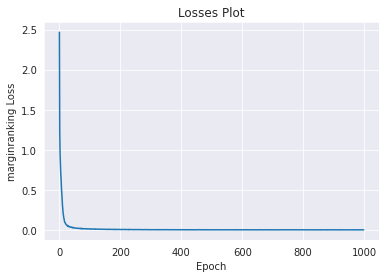

In [ ]:
result = pipeline(
    training=train_s,
    testing=test_s,
    validation=val_s,
    model = 'CompGCN',
    epochs = 1000,
    dimensions = 512,
    random_seed=420,
    device='gpu')
result.plot_losses()

In [ ]:
from pykeen.models.predict import get_head_prediction_df, predict_triples_df, get_tail_prediction_df, get_relation_prediction_df

df = get_head_prediction_df(
    model=result.model,
    tail_label="Tencent",
    relation_label="investors_names",
    triples_factory=result.training,
    add_novelties=False,)

df.head(5) #get top 5 rankings for the query


,head_id,head_label,score
1352,1352,Couple,9.252090
3078,3078,Pixm,4.076361
1110,1110,CB Therapeutics,4.022645
2756,2756,Mycroft,3.840453
801,801,Appuri,3.659595
